# Interpretability of PaSCient with Integrated Gradients

I made two types of aggregations:

- `abs` will take the average absolute value of cells for a given patient x cell-type
- `relu` will take the average relu of cells for a given patient x cell-type


Similar analysis can be done with the multilabel model. Here are the relevant files:

For binary: `/braid/cellm/interpretation/IG_attributions/attributions_binary_covid.h5ad`

For multilabel: `/braid/cellm/interpretation/IG_attributions/attributions_multilabel_covid.h5ad`


### List of files dependencies

- `/braid/cellm/interpretation/IG_attributions/all_indexed_attributions_binary_covid.h5ad`
- `/braid/cellm/interpretation/ref_genes_covid.csv`
- `/braid/cellm/interpretation/IG_attributions/binary_attributions_counts_COVID_blood.h5ad`
- `/homefs/home/debroue1/projects/cellm/data/pascient/attributions/new_multilabel_diff_attributions_multilabel_covid.h5ad`

## Figure 4 - panel A + B

In [ ]:
import anndata
import pandas as pd
from pascient.data.data_scimilarity import import_cell_ontology, get_id_mapper
import numpy as np
import tqdm

adata_full = anndata.read_h5ad("/braid/cellm/interpretation/IG_attributions/all_indexed_attributions_binary_covid.h5ad")

onto = import_cell_ontology()
id2name = get_id_mapper(onto)
adata_full.obs["cell_type"] = adata_full.obs["cell_type"].map(id2name)

aggregation_type = "relu" # or relu #this selects the type of aggregation.
#aggregation_type = "normal_mean" # or relu #this selects the type of aggregation.

/homefs/home/debroue1/miniforge3/envs/cellm/lib/python3.11/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [3]:
# TESTING OVERLAP with Fisher text

import numpy as np
from scipy.stats import fisher_exact

def p_value_calc(genes_list):

    N = 20000  
    A = set(genes_list)  
    B = ref_genes = set(pd.read_csv("/braid/cellm/interpretation/ref_genes_covid.csv",header=None)[1])

    # Calculate overlap and counts
    overlap = len(A.intersection(B))               # |A ∩ B|
    only_A  = len(A) - overlap                     # |A| - |A ∩ B|
    only_B  = len(B) - overlap                     # |B| - |A ∩ B|
    neither = N - (len(A) + len(B) - overlap)      # everything not in A or B

    # Build the 2x2 contingency table
    table = np.array([[overlap, only_A],
                    [only_B, neither]])

    # Perform Fisher's exact test
    odds_ratio, p_value = fisher_exact(table, alternative='two-sided')

    print("2x2 table:")
    print(table)
    print(f"Odds ratio: {odds_ratio}")
    print(f"P-value: {p_value}")

    return p_value

In [4]:
adata = adata_full[adata_full.obs["disease"] == "COVID-19"]

group_cols = ["study::::sample","cell_type","disease"]  # or whatever column you want to group by
df_obs = adata.obs[group_cols]
unique_combos = df_obs.drop_duplicates()

# We'll store results in a dict, keyed by tuples: (patient, cell_type)
group_result = {}

def abs_mean(x):
    if x.shape[0] == 0:
        return np.zeros(x.shape[1])
    else:
        return abs(x).mean(axis=0).A1

def relu(x):
    return (x > 0).multiply(x)
    
def relu_mean(x):
    if x.shape[0] == 0:
        return np.zeros(x.shape[1])
    else:
        return relu(x).mean(axis=0).A1

def normal_mean(x):
    return x.mean(axis=0).A1
    non_zero_counts = x.getnnz(axis=0)
    sum_weights = non_zero_counts
    sumX = relu(x).sum(axis=0).A1

    result = np.zeros(sumX.shape)
    non_zero_indices = (sum_weights > 0).nonzero()
    if non_zero_indices[0].size > 0:
        result[non_zero_indices] = (sumX[non_zero_indices][0] /
                                    sum_weights[non_zero_indices])
    result[sum_weights == 0] = 0
    return result

if aggregation_type == "abs":
    agg_fn = abs_mean
elif aggregation_type == "relu":
    agg_fn = relu_mean
elif aggregation_type == "normal_mean":
    agg_fn = normal_mean

#Loop over each unique combination
for _, row in tqdm.tqdm(unique_combos.iterrows()):

    # Build a boolean mask to select cells in this combination - we assume we have three contrasts.
    mask = ((adata.obs[group_cols[0]] == row[group_cols[0]]) & 
            (adata.obs[group_cols[1]] == row[group_cols[1]]) &
            (adata.obs[group_cols[2]] == row[group_cols[2]]))

    # Slice the sparse matrix
    X_sub = adata[mask].X

    if X_sub.shape[0] == 0:
        continue
    
    # 4. Compute mean (or sum, median, etc.) across all cells in that group
    #    (X_sub.mean(axis=0) returns a 1 x n_genes matrix; `.A1` makes it a 1D np.array)
    group_result_ =  agg_fn(X_sub)

    # Store in dict
    group_result[tuple(row.values)] = group_result_

# Convert the dictionary to a DataFrame
df_group_means = pd.DataFrame.from_dict(group_result, orient='index', columns=adata.var_names)

df_group_means.index = pd.MultiIndex.from_tuples(
    df_group_means.index, 
    names=group_cols
)

df = df_group_means.reset_index()

2504it [00:05, 432.83it/s]


In [5]:
# Filtering for common cell types (at least 10 patients per cell type)
patients_per_cell_type = df.groupby("cell_type")["study::::sample"].nunique()
common_cell_types = patients_per_cell_type[patients_per_cell_type > 10].index

In [6]:
gene_cols = [c for c in df.columns if c not in ['study::::sample','disease', 'tissue', 'cell_type', 'Unnamed: 0', 'cell_index']]
df_ = df.loc[(df["disease"]=="COVID-19") & (df["cell_type"].isin(common_cell_types))][["cell_type"] + gene_cols]

ct_map = {'naive thymus-derived CD4-positive, alpha-beta T cell':"CD4-positive T cell",
       'natural killer cell':"Natural killer cell", 
        'classical monocyte':"Classical monocyte",
       'CD4-positive helper T cell':"CD4-positive T cell",
       'naive thymus-derived CD8-positive, alpha-beta T cell':"CD8-positive T cell",
       'conventional dendritic cell':"Conventional dendritic cell", 
          'plasma cell':"Plasma cell",
       'CD16-negative, CD56-bright natural killer cell, human':"Natural killer cell",
       'naive B cell':"B cell", 
          'non-classical monocyte':"Non-classical monocyte",
       'CD8-positive, alpha-beta cytotoxic T cell':"CD8-positive T cell",
       'central memory CD8-positive, alpha-beta T cell':"CD8-positive T cell", 
        'nan':"nan",
       'regulatory T cell':"Regulatory T cell", 
          'B cell':"B cell", 
          'plasmacytoid dendritic cell':"Plasmacytoid dendritic cell",
       'effector memory CD8-positive, alpha-beta T cell':"CD8-positive T cell",
       'class switched memory B cell':"B cell", 
          'plasmablast':"Plasmablast",
       'mucosal invariant T cell':"mucosal invariant T cell",
       'effector memory CD8-positive, alpha-beta T cell, terminally differentiated':"CD8-positive T cell",
       'CD4-positive, alpha-beta cytotoxic T cell':"CD4-positive T cell", 
          'gamma-delta T cell':"gamma-delta T cell",
       'platelet':'platelet',
          'mature NK T cell':"NK T cell", 
          'hematopoietic precursor cell':"hematopoietic stem cell",
       'innate lymphoid cell':"innate lymphoid cell",
       'CD16-positive, CD56-dim natural killer cell, human':"Natural killer cell",
       'CD14-positive monocyte':"Classical monocyte", 
          'CD4-positive, alpha-beta memory T cell':"CD4-positive T cell",
       'CD8-positive, alpha-beta memory T cell':"CD8-positive T cell",
       'CD14-low, CD16-positive monocyte':"Non-classical monocyte", 
          'immature B cell':"B cell", 
          'T cell':"nan",
       'hematopoietic stem cell':"hematopoietic stem cell", 
          'neutrophil':"neutrophil", 
          'erythrocyte':"Erythrocyte",
          'CD4-positive, alpha-beta T cell':"CD4-positive T cell",
            'CD8-positive, alpha-beta T cell':"CD8-positive T cell",
            'progenitor cell': 'Progenitor cell',
            'lymphocyte': 'lymphocyte',
            'unswitched memory B cell': 'B cell',
            'IgM plasma cell': 'Plasma cell',
            'erythroid progenitor cell, mammalian': 'erythroid progenitor cell',
            'T-helper 2 cell': 'T-helper 2 cell',
   'myeloid dendritic cell': 'Myeloid dendritic cell',
   'central memory CD4-positive, alpha-beta T cell': 'CD4-positive T cell',
   'T-helper 22 cell' : 'T-helper 22 cell',
   'effector CD8-positive, alpha-beta T cell': 'CD8-positive T cell',
   #'dendritic cell, human': 'dendritic cell',
   'T follicular helper cell': 'T follicular helper cell',
   #'dendritic cell': 'dendritic cell', - we already have dendritic cells
   'ILC1, human': 'ILC1',
   'IgG plasma cell' : 'Plasma cell',
   'IgA plasma cell' : 'Plasma cell',
   'effector memory CD4-positive, alpha-beta T cell': 'CD4-positive T cell',
   'CD34-positive, CD38-negative hematopoietic stem cell': 'Hematopoietic stem cell',
   'T-helper 1 cell': 'T-helper 1 cell',
   'group 2 innate lymphoid cell, human': 'group 2 innate lymphoid cell',
   'monocyte': 'monocyte',
   'myeloid lineage restricted progenitor cell': 'myeloid lineage restricted progenitor cell',
   }

df_["cell_type"] = df_["cell_type"].map(ct_map)
df_ = df_.loc[df["cell_type"]!="nan"]
df_.dropna(inplace=True)

df_["data"] = np.log(df_[gene_cols].mean(axis=1))
df_["data"] = df_[gene_cols].sum(axis=1)

#df_per_ct = df_.groupby("cell_type").mean()[gene_cols].mean(axis=1).sort_values(ascending=True).reset_index()
df_per_ct = df_.groupby("cell_type")["data"].median().sort_values(ascending=True).reset_index()

df_["cell_type"] = pd.Categorical(df_["cell_type"], categories=df_per_ct["cell_type"], ordered=True)
#df_["data"] = df_[gene_cols].mean(axis=1)

/tmp/ipykernel_3015112/3561801021.py:15: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(


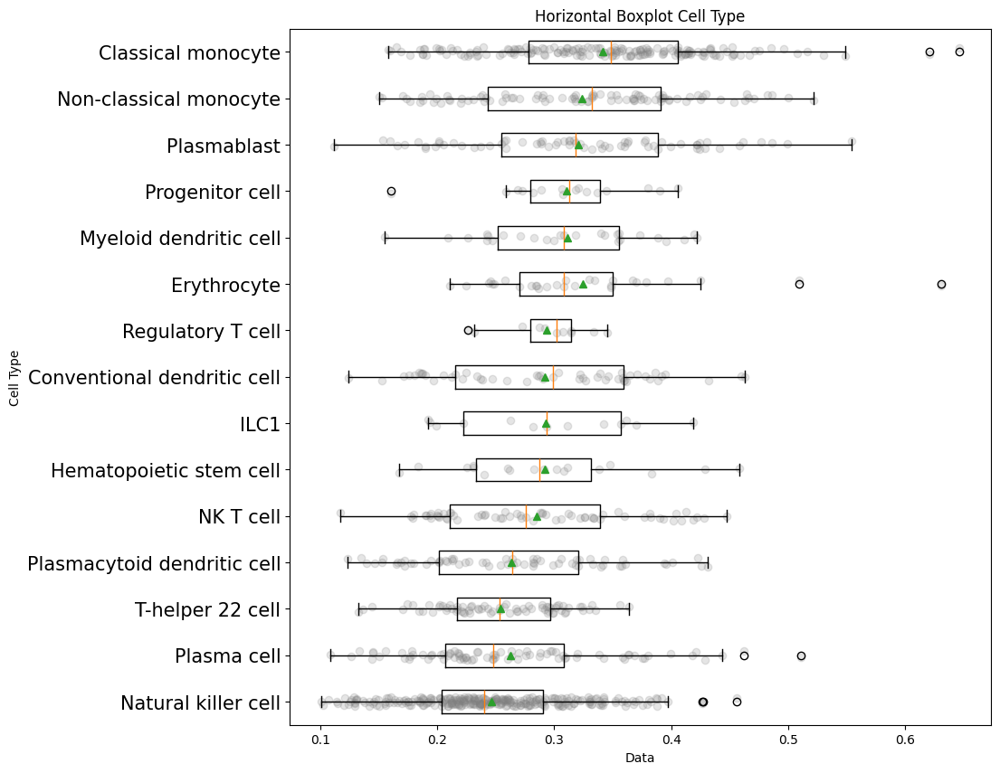

In [7]:
import matplotlib.pyplot as plt
import numpy as np

# Group your data by cell type and take the 15 highest cell types
cell_types = df_per_ct["cell_type"][-15:]

# Create a list of arrays, one array per cell type
data_groups = [df_.loc[df_["cell_type"] == ct, "data"].values 
               for ct in cell_types]

# Create figure and axes
fig, ax = plt.subplots(figsize=(10, 10))

# Draw a horizontal boxplot
bp = ax.boxplot(
    data_groups,
    vert=False,           # Horizontal orientation
    labels=cell_types,    # Labels for each group
    showmeans=True        # Show mean marker
)

# Overlay individual data points with random vertical jitter
for i, group_data in enumerate(data_groups, start=1):
    # Generate random jitter around the integer y-position "i"
    jittered_y = np.full_like(group_data, i, dtype=float)
    jittered_y += np.random.uniform(-0.1, 0.1, size=len(group_data))

    # Plot the points
    ax.scatter(group_data, jittered_y, alpha = 0.2, color = "grey")

# Set axis labels and title
ax.set_xlabel("Data")
ax.set_ylabel("Cell Type")
ax.set_title("Horizontal Boxplot Cell Type")
ax.tick_params(axis='y', labelsize=15)

plt.savefig("./figures/attributions_cell_types.pdf", bbox_inches="tight")
plt.show()

/homefs/home/debroue1/miniforge3/envs/cellm/lib/python3.11/site-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/homefs/home/debroue1/miniforge3/envs/cellm/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_3015112/3167493668.py:28: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(


2x2 table:
[[   14     1]
 [ 1320 18665]]
Odds ratio: 197.96212121212122
P-value: 4.554819974477902e-16


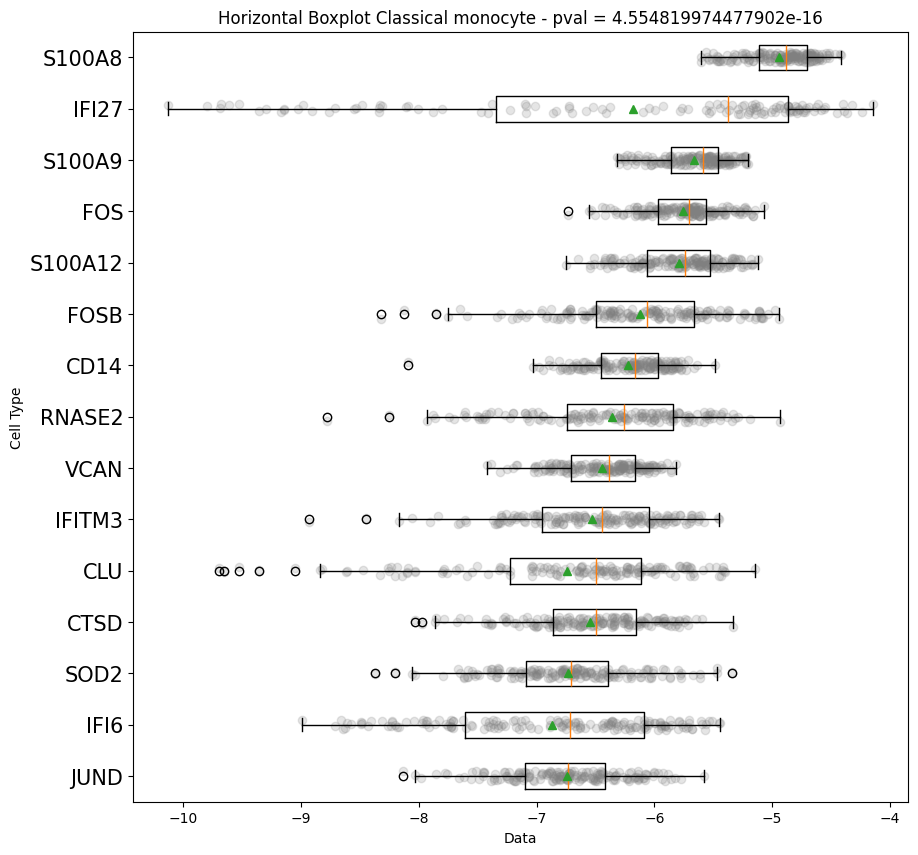

In [9]:
ct1 = "Classical monocyte"

df_ct1 = df.loc[(df["disease"]=="COVID-19")][["cell_type"] + gene_cols]
df_ct1["cell_type"] = df_ct1["cell_type"].map(ct_map)
df_ct1 = df_ct1.loc[df_ct1["cell_type"]== ct1].copy()

df_per_gene = np.log(df_ct1[gene_cols]).replace([np.inf, -np.inf], np.nan)
df_per_gene = df_per_gene.median().sort_values(ascending=False).reset_index()
top20_genes = df_per_gene.loc[~df_per_gene["gene_symbol"].str.startswith("MT")][:15]["gene_symbol"]

df_ct1_plot = df_ct1[top20_genes].melt()
df_ct1_plot["variable"] = pd.Categorical(df_ct1_plot["gene_symbol"], categories=top20_genes[::-1], ordered=True)

df_ct1_plot["value"] = np.log(df_ct1_plot["value"])
df_ct1_plot["value"] = df_ct1_plot["value"].replace([np.inf, -np.inf], np.nan)
# Create a categorical type based on the order of means, this helps in sorting the DataFrame for plotting
df_ct1_plot.dropna(inplace=True)

genes_list = top20_genes[::-1]
# Create a list of arrays, one array per cell type
data_groups = [df_ct1_plot.loc[df_ct1_plot["gene_symbol"] == gs, "value"].values 
               for gs in genes_list]

# Create figure and axes
fig, ax = plt.subplots(figsize=(10, 10))

# Draw a horizontal boxplot
bp = ax.boxplot(
    data_groups,
    vert=False,           # Horizontal orientation
    labels=genes_list,    # Labels for each group
    showmeans=True        # Show mean marker
)

# Overlay individual data points with random vertical jitter
for i, group_data in enumerate(data_groups, start=1):
    # Generate random jitter around the integer y-position "i"
    jittered_y = np.full_like(group_data, i, dtype=float)
    jittered_y += np.random.uniform(-0.1, 0.1, size=len(group_data))

    # Plot the points
    ax.scatter(group_data, jittered_y, alpha = 0.2, color = "grey")


pval = p_value_calc(top20_genes)
# Set axis labels and title
ax.set_xlabel("Data")
ax.set_ylabel("Cell Type")
ax.set_title(f"Horizontal Boxplot {ct1} - pval = {pval}")
ax.tick_params(axis='y', labelsize=15)
plt.savefig("./figures/attributions_ct1_gene.pdf", bbox_inches="tight")
plt.show()

/homefs/home/debroue1/miniforge3/envs/cellm/lib/python3.11/site-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/homefs/home/debroue1/miniforge3/envs/cellm/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_3015112/2257919065.py:31: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(


2x2 table:
[[   12     3]
 [ 1322 18663]]
Odds ratio: 56.468986384266266
P-value: 2.788428864437569e-12


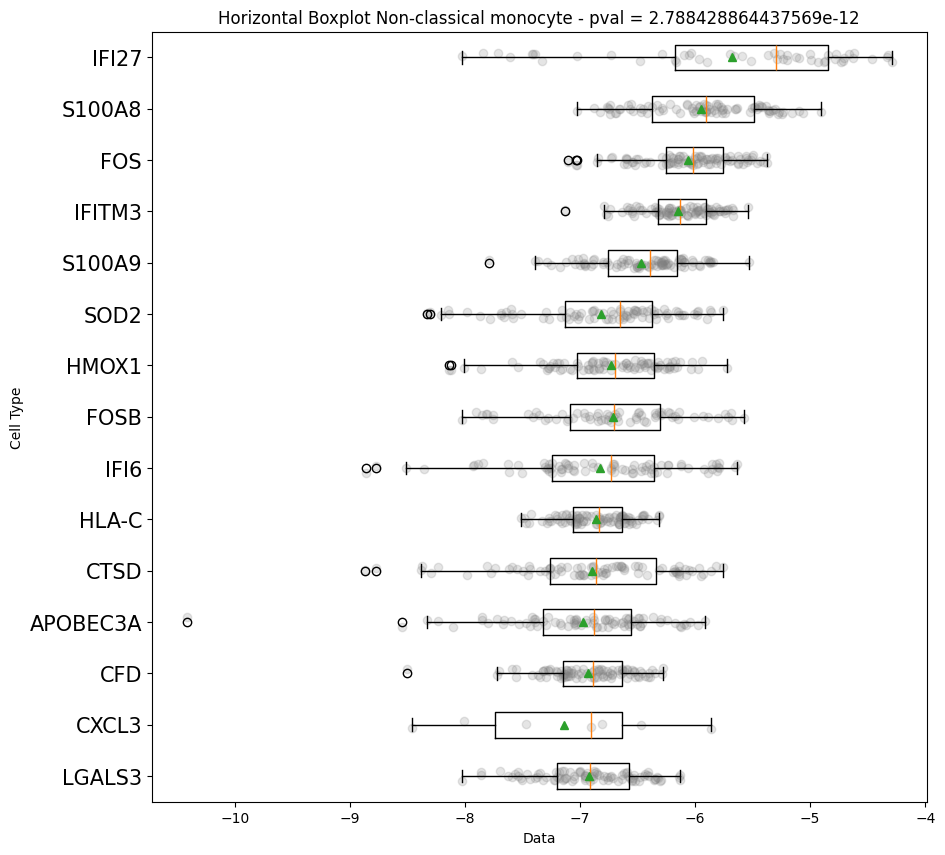

In [10]:
ct1 = "Non-classical monocyte"

df_ct1 = df.loc[(df["disease"]=="COVID-19")][["cell_type"] + gene_cols]
df_ct1["cell_type"] = df_ct1["cell_type"].map(ct_map)
df_ct1 = df_ct1.loc[df_ct1["cell_type"]== ct1].copy()

df_gt = ((df_ct1[gene_cols]>0).sum() > 3)
genes_with_non_zero_attrs = df_gt.loc[df_gt].index.tolist()

df_per_gene = np.log(df_ct1[genes_with_non_zero_attrs]).replace([np.inf, -np.inf], np.nan)
df_per_gene = df_per_gene.median().sort_values(ascending=False).reset_index()
top20_genes = df_per_gene.loc[~df_per_gene["gene_symbol"].str.startswith("MT")][:15]["gene_symbol"]

df_ct1_plot = df_ct1[top20_genes].melt()
df_ct1_plot["variable"] = pd.Categorical(df_ct1_plot["gene_symbol"], categories=top20_genes[::-1], ordered=True)

df_ct1_plot["value"] = np.log(df_ct1_plot["value"])
df_ct1_plot["value"] = df_ct1_plot["value"].replace([np.inf, -np.inf], np.nan)
# Create a categorical type based on the order of means, this helps in sorting the DataFrame for plotting
df_ct1_plot.dropna(inplace=True)

genes_list = top20_genes[::-1]
# Create a list of arrays, one array per cell type
data_groups = [df_ct1_plot.loc[df_ct1_plot["gene_symbol"] == gs, "value"].values 
               for gs in genes_list]

# Create figure and axes
fig, ax = plt.subplots(figsize=(10, 10))

# Draw a horizontal boxplot
bp = ax.boxplot(
    data_groups,
    vert=False,           # Horizontal orientation
    labels=genes_list,    # Labels for each group
    showmeans=True        # Show mean marker
)

# Overlay individual data points with random vertical jitter
for i, group_data in enumerate(data_groups, start=1):
    # Generate random jitter around the integer y-position "i"
    jittered_y = np.full_like(group_data, i, dtype=float)
    jittered_y += np.random.uniform(-0.1, 0.1, size=len(group_data))

    # Plot the points
    ax.scatter(group_data, jittered_y, alpha = 0.2, color = "grey")

p_val = p_value_calc(top20_genes)

# Set axis labels and title
ax.set_xlabel("Data")
ax.set_ylabel("Cell Type")
ax.set_title(f"Horizontal Boxplot {ct1} - pval = {p_val}")
ax.tick_params(axis='y', labelsize=15)
plt.savefig("./figures/attributions_ct2_gene.pdf", bbox_inches="tight")
plt.show()

/homefs/home/debroue1/miniforge3/envs/cellm/lib/python3.11/site-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/homefs/home/debroue1/miniforge3/envs/cellm/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_3015112/3288421839.py:28: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(


2x2 table:
[[   11     9]
 [ 1323 18657]]
Odds ratio: 17.235827664399093
P-value: 1.0705595379590285e-08


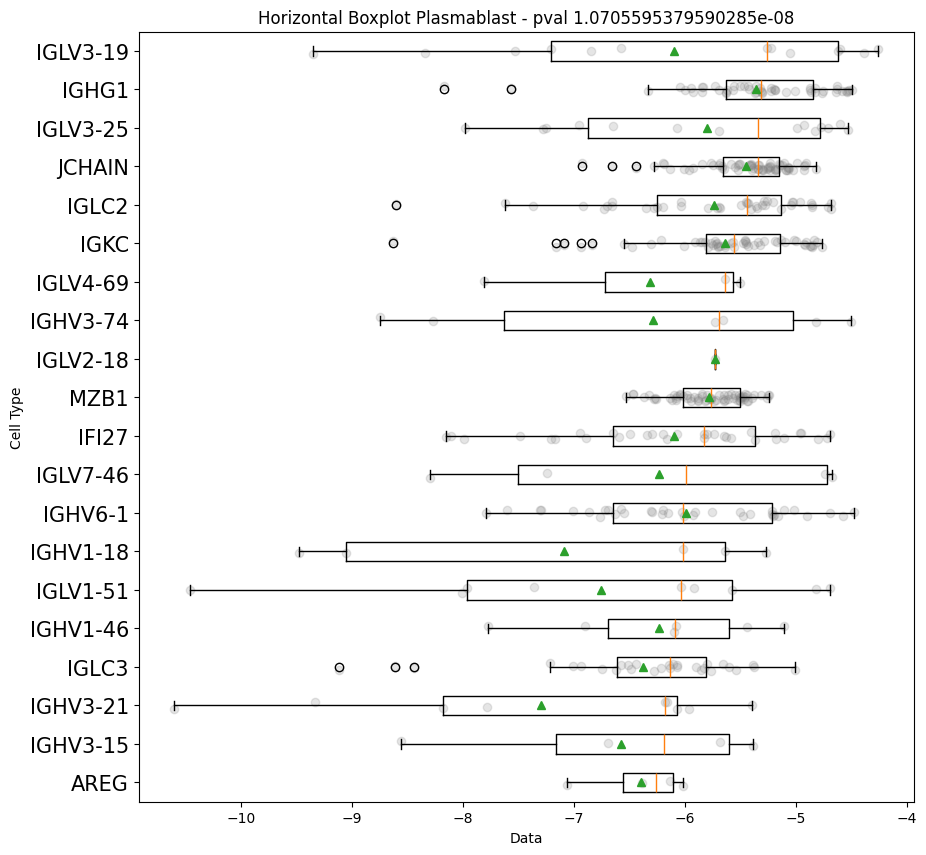

In [11]:
ct1 = "Plasmablast"

df_ct1 = df.loc[(df["disease"]=="COVID-19")][["cell_type"] + gene_cols]
df_ct1["cell_type"] = df_ct1["cell_type"].map(ct_map)
df_ct1 = df_ct1.loc[df_ct1["cell_type"]== ct1].copy()

df_per_gene = np.log(df_ct1[gene_cols]).replace([np.inf, -np.inf], np.nan)
df_per_gene = df_per_gene.median().sort_values(ascending=False).reset_index()
top20_genes = df_per_gene.loc[~df_per_gene["gene_symbol"].str.startswith("MT")][:20]["gene_symbol"]

df_ct1_plot = df_ct1[top20_genes].melt()
df_ct1_plot["variable"] = pd.Categorical(df_ct1_plot["gene_symbol"], categories=top20_genes[::-1], ordered=True)

df_ct1_plot["value"] = np.log(df_ct1_plot["value"])
df_ct1_plot["value"] = df_ct1_plot["value"].replace([np.inf, -np.inf], np.nan)
# Create a categorical type based on the order of means, this helps in sorting the DataFrame for plotting
df_ct1_plot.dropna(inplace=True)

genes_list = top20_genes[::-1]
# Create a list of arrays, one array per cell type
data_groups = [df_ct1_plot.loc[df_ct1_plot["gene_symbol"] == gs, "value"].values 
               for gs in genes_list]

# Create figure and axes
fig, ax = plt.subplots(figsize=(10, 10))

# Draw a horizontal boxplot
bp = ax.boxplot(
    data_groups,
    vert=False,           # Horizontal orientation
    labels=genes_list,    # Labels for each group
    showmeans=True        # Show mean marker
)

# Overlay individual data points with random vertical jitter
for i, group_data in enumerate(data_groups, start=1):
    # Generate random jitter around the integer y-position "i"
    jittered_y = np.full_like(group_data, i, dtype=float)
    jittered_y += np.random.uniform(-0.1, 0.1, size=len(group_data))

    # Plot the points
    ax.scatter(group_data, jittered_y, alpha = 0.2, color = "grey")

pval = p_value_calc(top20_genes)

# Set axis labels and title
ax.set_xlabel("Data")
ax.set_ylabel("Cell Type")
ax.set_title(f"Horizontal Boxplot {ct1} - pval {pval}")
ax.tick_params(axis='y', labelsize=15)
plt.savefig("./figures/attributions_ct3_gene.pdf", bbox_inches="tight")
plt.show()

## Figure 4 - panel C

In [18]:
import scanpy as sc
adata = anndata.read_h5ad('/braid/cellm/interpretation/IG_attributions/binary_attributions_counts_COVID_blood.h5ad')

/homefs/home/debroue1/miniforge3/envs/cellm/lib/python3.11/site-packages/anndata/_core/anndata.py:1818: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



Dictionaries to map granular cell types to higher-level cell types and study::::sample int to full study/sample information

In [19]:
full_sample_study = {0: 'b0cf0afa-ec40-4d65-b570-ed4ceacc6813::::P6',
 1: 'b0cf0afa-ec40-4d65-b570-ed4ceacc6813::::P1',
 2: 'b0cf0afa-ec40-4d65-b570-ed4ceacc6813::::P5',
 3: 'b0cf0afa-ec40-4d65-b570-ed4ceacc6813::::P8',
 4: 'b0cf0afa-ec40-4d65-b570-ed4ceacc6813::::P3',
 5: 'b0cf0afa-ec40-4d65-b570-ed4ceacc6813::::P4',
 6: 'b0cf0afa-ec40-4d65-b570-ed4ceacc6813::::P7',
 7: 'b0cf0afa-ec40-4d65-b570-ed4ceacc6813::::P2',
 8: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919233',
 9: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919331',
 10: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV03_CV0074',
 11: 'ddfad306-714d-4cc0-9985-d9072820c530::::AP10',
 12: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV02_CV0902',
 13: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV09_CV0279',
 14: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV03_CV0084',
 15: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919328',
 16: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV13_CV0934',
 17: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143320',
 18: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919178',
 19: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV10_CV0231',
 20: 'ddfad306-714d-4cc0-9985-d9072820c530::::AP11',
 21: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143325',
 22: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV15_CV0176',
 23: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV08_CV0915',
 24: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV02_CV0052',
 25: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV12_CV0926',
 26: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143272',
 27: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143327',
 28: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143424',
 29: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV01_CV0144',
 30: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9179821',
 31: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV06_CV0037',
 32: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919226',
 33: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV12_CV0068',
 34: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV01_CV0902',
 35: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919230',
 36: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV11_CV0050',
 37: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV07_CV0094',
 38: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV08_CV0073',
 39: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV05_CV0128',
 40: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919329',
 41: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV05_CV0929',
 42: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV10_CV0160',
 43: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143276',
 44: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV05_CV0120',
 45: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV02_CV0068',
 46: 'ddfad306-714d-4cc0-9985-d9072820c530::::AP1',
 47: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9179823',
 48: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919281',
 49: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143324',
 50: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919278',
 51: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV04_CV0911',
 52: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143326',
 53: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143271',
 54: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV14_CV0137',
 55: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV10_CV0939',
 56: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143427',
 57: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV10_CV0198',
 58: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143425',
 59: 'ddfad306-714d-4cc0-9985-d9072820c530::::AP6',
 60: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919276',
 61: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV13_CV0171',
 62: 'ddfad306-714d-4cc0-9985-d9072820c530::::AP2',
 63: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV14_CV0284',
 64: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9179822',
 65: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919231',
 66: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV15_CV0231',
 67: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919283',
 68: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143270',
 69: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143322',
 70: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143420',
 71: 'ddfad306-714d-4cc0-9985-d9072820c530::::newcastle20',
 72: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143273',
 73: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143423',
 74: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9179824',
 75: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV05_CV0284',
 76: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919333',
 77: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV09_CV0917',
 78: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV06_CV0201',
 79: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919330',
 80: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV13_CV0326',
 81: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919229',
 82: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143274',
 83: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV14_CV0940',
 84: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919232',
 85: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV09_CV0171',
 86: 'ddfad306-714d-4cc0-9985-d9072820c530::::AP3',
 87: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV08_CV0201',
 88: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV14_CV0050',
 89: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919228',
 90: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV03_CV0176',
 91: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV11_CV0058',
 92: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9179825',
 93: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919332',
 94: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919326',
 95: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV12_CV0178',
 96: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV01_CV0025',
 97: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919176',
 98: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV12_CV0062',
 99: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV04_CV0100',
 100: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV07_CV0134',
 101: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV01_CV0904',
 102: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919227',
 103: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV07_CV0137',
 104: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919327',
 105: 'ddfad306-714d-4cc0-9985-d9072820c530::::newcastle21',
 106: 'ddfad306-714d-4cc0-9985-d9072820c530::::newcastle74',
 107: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143275',
 108: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143426',
 109: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV11_CV0257',
 110: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV07_CV0104',
 111: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV06_CV0178',
 112: 'ddfad306-714d-4cc0-9985-d9072820c530::::AP8',
 113: 'ddfad306-714d-4cc0-9985-d9072820c530::::AP4',
 114: 'ddfad306-714d-4cc0-9985-d9072820c530::::newcastle21v2',
 115: 'ddfad306-714d-4cc0-9985-d9072820c530::::newcastle004v2',
 116: 'ddfad306-714d-4cc0-9985-d9072820c530::::AP12',
 117: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143323',
 118: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919280',
 119: 'ddfad306-714d-4cc0-9985-d9072820c530::::newcastle59',
 120: 'ddfad306-714d-4cc0-9985-d9072820c530::::newcastle49',
 121: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV02_CV0059',
 122: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919177',
 123: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV09_CV0062',
 124: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143371',
 125: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV06_CV0234',
 126: 'ddfad306-714d-4cc0-9985-d9072820c530::::AP9',
 127: 'ddfad306-714d-4cc0-9985-d9072820c530::::newcastle65',
 128: 'ddfad306-714d-4cc0-9985-d9072820c530::::AP5',
 129: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143277',
 130: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919282',
 131: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919179',
 132: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV11_CV0180',
 133: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143321',
 134: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919277',
 135: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH8919279',
 136: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9179826',
 137: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143422',
 138: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV04_CV0164',
 139: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV04_CV0262',
 140: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV13_CV0073',
 141: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV15_CV0944',
 142: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV15_CV0257',
 143: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV03_CV0200',
 144: 'ddfad306-714d-4cc0-9985-d9072820c530::::MH9143421',
 145: 'ddfad306-714d-4cc0-9985-d9072820c530::::BGCV08_CV0155',
 146: 'DS000010017::::DS000010017-cytotoxic_t',
 147: 'DS000010143::::DS000010143-GSM3544603',
 148: 'DS000010023::::DS000010023',
 149: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP10',
 150: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP30',
 151: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AN6',
 152: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PC17',
 153: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AN2',
 154: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP11',
 155: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP31',
 156: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PC18',
 157: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP1-post',
 158: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP2-Post',
 159: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PC11',
 160: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP32',
 161: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PP8',
 162: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PC26',
 163: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PP4',
 164: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AN7',
 165: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PC27',
 166: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AN3',
 167: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PP13',
 168: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP41',
 169: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP1',
 170: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP16',
 171: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PC21',
 172: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PP14',
 173: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PC9',
 174: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PC5',
 175: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PP9',
 176: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PP5',
 177: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP17',
 178: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PP15',
 179: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP18',
 180: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP6',
 181: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP2',
 182: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP19',
 183: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP26',
 184: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP7-post',
 185: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PC24',
 186: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AN13',
 187: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP9-post',
 188: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PC6',
 189: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP27',
 190: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PC10',
 191: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AN14',
 192: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP13',
 193: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AN9',
 194: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP28',
 195: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PP11',
 196: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP3',
 197: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP15',
 198: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP22',
 199: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP37',
 200: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP23',
 201: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP38',
 202: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PP1',
 203: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP24',
 204: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP8',
 205: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP4',
 206: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP39',
 207: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AN11',
 208: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP12',
 209: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PC19',
 210: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AN12',
 211: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP5-post',
 212: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP13',
 213: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP6-post',
 214: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PC2',
 215: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PP6',
 216: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PP2',
 217: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP9',
 218: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AP5',
 219: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP20',
 220: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AN5',
 221: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::AN1',
 222: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP35',
 223: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PC29',
 224: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP21',
 225: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP36',
 226: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PP3',
 227: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::PP16',
 228: '03f821b4-87be-4ff4-b65a-b5fc00061da7::::NP44',
 229: 'DS000010042::::DS000010042',
 230: '436154da-bcf1-4130-9c8b-120ff9a888f2::::c896fdae-1a67-4c5e-b3f8-f4671744e35f',
 231: '436154da-bcf1-4130-9c8b-120ff9a888f2::::3be3bf0e-065c-4451-bdff-100e1f88b8d9',
 232: '436154da-bcf1-4130-9c8b-120ff9a888f2::::98e974a9-c08e-4066-8930-d627b18f1a89',
 233: '436154da-bcf1-4130-9c8b-120ff9a888f2::::d0660ae1-7bd5-4f68-9131-434571c29e96',
 234: '436154da-bcf1-4130-9c8b-120ff9a888f2::::f10971cb-edb4-461e-acaa-820d7ab15ef8',
 235: '436154da-bcf1-4130-9c8b-120ff9a888f2::::d65c2394-3eed-48b8-8a26-5f214003f312',
 236: '436154da-bcf1-4130-9c8b-120ff9a888f2::::bc16e1fe-cd25-4a6b-a329-2e2c7121ad8d',
 237: '436154da-bcf1-4130-9c8b-120ff9a888f2::::39006dbe-f7a7-4f05-aeac-0ca1876a7a3f',
 238: '436154da-bcf1-4130-9c8b-120ff9a888f2::::b7c8655d-8d5e-4865-bc97-3c606cdaf5e9',
 239: '436154da-bcf1-4130-9c8b-120ff9a888f2::::d3aef314-d83b-4ce7-ac01-5ab74ea0fa4f',
 240: '436154da-bcf1-4130-9c8b-120ff9a888f2::::4752a18e-a3a0-4699-99e8-18c7fee59072',
 241: '436154da-bcf1-4130-9c8b-120ff9a888f2::::1046eed3-a68a-4d02-b26c-4f8054029760',
 242: '436154da-bcf1-4130-9c8b-120ff9a888f2::::0a4bb8a3-0abf-46eb-a33c-c14a23d44387',
 243: '436154da-bcf1-4130-9c8b-120ff9a888f2::::9e6a490c-24a3-41fa-a5e3-2879e75b45ff',
 244: '436154da-bcf1-4130-9c8b-120ff9a888f2::::d9afaa54-38e3-48a7-b173-e59346f87a06',
 245: '436154da-bcf1-4130-9c8b-120ff9a888f2::::6d32f89c-b5b9-4486-94f8-5368115f0408',
 246: '436154da-bcf1-4130-9c8b-120ff9a888f2::::02404cf5-4210-43b8-b998-797422f7b1a8',
 247: '436154da-bcf1-4130-9c8b-120ff9a888f2::::f3091b7a-a59b-4bee-a4c4-c930424b63f3',
 248: '436154da-bcf1-4130-9c8b-120ff9a888f2::::bd6c3fde-42cb-459e-8e81-b5ef2a90190f',
 249: '436154da-bcf1-4130-9c8b-120ff9a888f2::::58491584-2df2-4f81-829b-6f930c4d8649',
 250: '436154da-bcf1-4130-9c8b-120ff9a888f2::::803fece6-2b2d-4ba2-8370-49385734ab3b',
 251: '436154da-bcf1-4130-9c8b-120ff9a888f2::::68a0c04e-d86a-4f1b-a557-ec0331c4f71f',
 252: '436154da-bcf1-4130-9c8b-120ff9a888f2::::7eebe697-187f-4cce-b10d-9f71235d3a4f',
 253: '436154da-bcf1-4130-9c8b-120ff9a888f2::::f9330687-3035-4f1a-ab22-1f86de08b66a',
 254: '436154da-bcf1-4130-9c8b-120ff9a888f2::::2ed3aef8-6c08-4c7c-9d7c-8aa618321841',
 255: '436154da-bcf1-4130-9c8b-120ff9a888f2::::37214563-4102-451e-a546-a1833db3aedd',
 256: '436154da-bcf1-4130-9c8b-120ff9a888f2::::7ded846e-1cc6-405e-b17f-6e99856f39e4',
 257: '436154da-bcf1-4130-9c8b-120ff9a888f2::::e93a00ac-77ef-4890-81e0-43382903cb0c',
 258: '436154da-bcf1-4130-9c8b-120ff9a888f2::::3caa3c5a-9c12-464a-a794-8b7ca2cfaace',
 259: '436154da-bcf1-4130-9c8b-120ff9a888f2::::a51ffc5a-e4cb-4b47-9154-4514e1dc9d65',
 260: '436154da-bcf1-4130-9c8b-120ff9a888f2::::037d2b66-6091-42f8-b0ff-07c9130dea62',
 261: '436154da-bcf1-4130-9c8b-120ff9a888f2::::9245fdfa-904c-4421-ba87-60da990f40ed',
 262: '436154da-bcf1-4130-9c8b-120ff9a888f2::::b99cfca7-d0cc-427f-b4ec-373067995536',
 263: '436154da-bcf1-4130-9c8b-120ff9a888f2::::0332dc59-e2c0-4b55-9921-3e0d0f565e5e',
 264: '436154da-bcf1-4130-9c8b-120ff9a888f2::::71ddcc80-c234-4f27-aa06-b49ae5a28784',
 265: '436154da-bcf1-4130-9c8b-120ff9a888f2::::3e17b93b-6d64-4b05-adf1-bee9b370788c',
 266: '436154da-bcf1-4130-9c8b-120ff9a888f2::::e237fb4b-e3eb-4365-b625-8e31534d7508',
 267: '436154da-bcf1-4130-9c8b-120ff9a888f2::::5f31d290-7101-4ef4-9510-f3692aba34de',
 268: '436154da-bcf1-4130-9c8b-120ff9a888f2::::83a38413-11d1-494e-81d3-56f594148b71',
 269: '436154da-bcf1-4130-9c8b-120ff9a888f2::::fd256bdb-e6dd-47ef-a4e4-ac0a7d2dcd1e',
 270: '436154da-bcf1-4130-9c8b-120ff9a888f2::::39824ee5-7478-4dc4-baad-9a90e3ca30ff',
 271: '436154da-bcf1-4130-9c8b-120ff9a888f2::::bf5fe2a7-ee49-4304-a20a-01596de43619',
 272: '436154da-bcf1-4130-9c8b-120ff9a888f2::::27978e88-cfed-4b90-b622-fd572e5ea40d',
 273: '436154da-bcf1-4130-9c8b-120ff9a888f2::::43af3cab-af35-45c0-82f6-304ca64e9f0d',
 274: '436154da-bcf1-4130-9c8b-120ff9a888f2::::fcadfde9-31cc-4f2d-bf5b-b7deec30439a',
 275: '436154da-bcf1-4130-9c8b-120ff9a888f2::::e0d91e74-9836-43b7-b866-383398b2df70',
 276: '436154da-bcf1-4130-9c8b-120ff9a888f2::::fa40c3dd-a3a5-4ffd-9470-ab39682965df',
 277: '436154da-bcf1-4130-9c8b-120ff9a888f2::::11c6a06c-f0e0-45bc-b5ec-1b14445548d4',
 278: '436154da-bcf1-4130-9c8b-120ff9a888f2::::f46fc513-1a40-4930-a9ee-c9c1da5de582',
 279: '436154da-bcf1-4130-9c8b-120ff9a888f2::::b25deecf-dab2-4c86-ae98-047ee79ce320',
 280: '436154da-bcf1-4130-9c8b-120ff9a888f2::::c1ac7564-4e90-4bc9-ad66-24cecb27127f',
 281: '436154da-bcf1-4130-9c8b-120ff9a888f2::::a3ef43c2-caad-4ca3-86d0-3c362e778877',
 282: '436154da-bcf1-4130-9c8b-120ff9a888f2::::f09bc3b1-4818-4240-bf10-415636180b4a',
 283: '436154da-bcf1-4130-9c8b-120ff9a888f2::::2261aca1-82ee-4276-9eaa-1d61688bd2f8',
 284: '436154da-bcf1-4130-9c8b-120ff9a888f2::::bca9c9c7-62f2-4427-a3aa-3dcd297ced84',
 285: '436154da-bcf1-4130-9c8b-120ff9a888f2::::869da0bb-4487-493b-86ca-e601eee46196',
 286: '436154da-bcf1-4130-9c8b-120ff9a888f2::::3876bd23-e063-4b96-89ae-eec693743c86',
 287: '436154da-bcf1-4130-9c8b-120ff9a888f2::::13ec931d-a536-4679-ad6c-39d7bbaa8d5d',
 288: '436154da-bcf1-4130-9c8b-120ff9a888f2::::45eb2bf7-4993-46ea-9055-645ad7d29a5e',
 289: '436154da-bcf1-4130-9c8b-120ff9a888f2::::bffca8a1-fc84-4f20-acae-3cf0d6313002',
 290: '436154da-bcf1-4130-9c8b-120ff9a888f2::::f0f0c7c0-c2dd-4f71-a15d-cc29ad1144b6',
 291: '436154da-bcf1-4130-9c8b-120ff9a888f2::::b0c3cf74-58cf-43e7-b4df-61ef0b3a9fdc',
 292: '436154da-bcf1-4130-9c8b-120ff9a888f2::::6e8c12a9-b87c-4eb7-9587-70b0174e3f60',
 293: '436154da-bcf1-4130-9c8b-120ff9a888f2::::a8a25630-19f3-4fc6-811b-62332dee7b86',
 294: '436154da-bcf1-4130-9c8b-120ff9a888f2::::e8295a2a-ebac-417e-858e-52cd294dd906',
 295: '436154da-bcf1-4130-9c8b-120ff9a888f2::::6d8ca891-26ad-487f-b162-a32a835fd534',
 296: '436154da-bcf1-4130-9c8b-120ff9a888f2::::503f2d5f-e904-46f9-99c6-c89dec37be2d',
 297: '436154da-bcf1-4130-9c8b-120ff9a888f2::::3672d82d-f24c-4536-b75a-0627889e1426',
 298: '436154da-bcf1-4130-9c8b-120ff9a888f2::::9c889cb3-c0ae-400b-b27d-e52241a7d342',
 299: '436154da-bcf1-4130-9c8b-120ff9a888f2::::64d258d2-f11a-4c9b-8206-614aef9d5a38',
 300: '436154da-bcf1-4130-9c8b-120ff9a888f2::::145e48d0-e1f3-48cd-a198-d4c62e1f8ba0',
 301: '436154da-bcf1-4130-9c8b-120ff9a888f2::::cd2dc30f-074c-4881-b328-a35cefdc7c68',
 302: '436154da-bcf1-4130-9c8b-120ff9a888f2::::279d06b2-a656-413d-8805-b07615ea48ee',
 303: '436154da-bcf1-4130-9c8b-120ff9a888f2::::11e9756a-d4e3-4024-8167-81f1c9013e09',
 304: '436154da-bcf1-4130-9c8b-120ff9a888f2::::cf0f9104-fd3e-4cdd-ad08-69035510a32d',
 305: '436154da-bcf1-4130-9c8b-120ff9a888f2::::55e1ebfb-4571-4e95-9c84-8f81d3335fd9',
 306: '436154da-bcf1-4130-9c8b-120ff9a888f2::::43f3d10e-a47a-4f63-965c-a8fe58d5861f',
 307: '436154da-bcf1-4130-9c8b-120ff9a888f2::::46e0206c-f34e-4e58-a099-c5de09a89bdb',
 308: '436154da-bcf1-4130-9c8b-120ff9a888f2::::63c521a1-5a88-4a39-8d65-a0999cb2cfa6',
 309: '436154da-bcf1-4130-9c8b-120ff9a888f2::::37d3daeb-c0f5-414a-8b98-0517e7464535',
 310: '436154da-bcf1-4130-9c8b-120ff9a888f2::::0a1148dc-356f-4dc4-9c32-bf0823257d93',
 311: '436154da-bcf1-4130-9c8b-120ff9a888f2::::76337712-cfcd-4760-a462-1269a5ff215c',
 312: '436154da-bcf1-4130-9c8b-120ff9a888f2::::e6200840-e5b5-4bef-b341-f0f3e7425f5f',
 313: '436154da-bcf1-4130-9c8b-120ff9a888f2::::4f96324f-0403-4ba1-b110-02c96a5cba84',
 314: '436154da-bcf1-4130-9c8b-120ff9a888f2::::1d38192e-5e0c-43e5-a813-835461e099ae',
 315: '436154da-bcf1-4130-9c8b-120ff9a888f2::::d2ec9dd4-2fbf-4dea-a274-4fd13d7395b8',
 316: '436154da-bcf1-4130-9c8b-120ff9a888f2::::5d0826b4-fa43-4e32-8426-4ee9b3950e0f',
 317: '436154da-bcf1-4130-9c8b-120ff9a888f2::::09fc2399-2a9e-47ec-a0f4-f0c83ee59b98',
 318: '436154da-bcf1-4130-9c8b-120ff9a888f2::::27ae3b51-85d4-49fe-bcc3-89b0cbd59e23',
 319: '436154da-bcf1-4130-9c8b-120ff9a888f2::::55555033-33d9-49bc-b378-c20c8ed2fb1b',
 320: '436154da-bcf1-4130-9c8b-120ff9a888f2::::886dc81a-06f7-47dc-bdf6-da1524e86d7d',
 321: '436154da-bcf1-4130-9c8b-120ff9a888f2::::4452abfd-aa95-4982-b2c8-ac779e0cc76e',
 322: '436154da-bcf1-4130-9c8b-120ff9a888f2::::c4f152fb-04b4-4f5d-b4e6-4a3a93da7881',
 323: '436154da-bcf1-4130-9c8b-120ff9a888f2::::f0a33a73-192b-4398-b8bc-05eb0c59ae54',
 324: '436154da-bcf1-4130-9c8b-120ff9a888f2::::e0286325-9289-4765-af44-1bded6b1d3df',
 325: '436154da-bcf1-4130-9c8b-120ff9a888f2::::910e95f1-f837-41c6-bcb3-683780852c38',
 326: '436154da-bcf1-4130-9c8b-120ff9a888f2::::f6f39d84-6fb4-4519-9efa-f9ca4651e3c9',
 327: '436154da-bcf1-4130-9c8b-120ff9a888f2::::77712740-d29f-4bb0-9b90-2aa3db72f3ba',
 328: '436154da-bcf1-4130-9c8b-120ff9a888f2::::c3cd3b9e-6295-43ed-babc-46a5ab454773',
 329: 'eb735cc9-d0a7-48fa-b255-db726bf365af::::RV8959686',
 330: 'eb735cc9-d0a7-48fa-b255-db726bf365af::::RV9039354',
 331: 'eb735cc9-d0a7-48fa-b255-db726bf365af::::RV8919578',
 332: 'eb735cc9-d0a7-48fa-b255-db726bf365af::::RV8959684',
 333: 'eb735cc9-d0a7-48fa-b255-db726bf365af::::RV8959683',
 334: 'eb735cc9-d0a7-48fa-b255-db726bf365af::::RV8919628',
 335: 'eb735cc9-d0a7-48fa-b255-db726bf365af::::RV9039355',
 336: 'eb735cc9-d0a7-48fa-b255-db726bf365af::::RV8959685',
 337: 'eb735cc9-d0a7-48fa-b255-db726bf365af::::RV9039356',
 338: '5d445965-6f1a-4b68-ba3a-b8f765155d3a::::blood 1',
 339: '5d445965-6f1a-4b68-ba3a-b8f765155d3a::::blood 3',
 340: 'DS000010030::::DS000010030',
 341: 'DS000010028::::DS000010028',
 342: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::ICC_C_0001',
 343: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1101',
 344: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1044',
 345: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1143',
 346: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1060',
 347: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1076',
 348: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1010',
 349: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1015',
 350: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::ICC-C-1117',
 351: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1029',
 352: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1151',
 353: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1094',
 354: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::ICC_C_0002',
 355: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1021',
 356: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::ICC_C_0004',
 357: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1043',
 358: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1057',
 359: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1033',
 360: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1046',
 361: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1093',
 362: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1054',
 363: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1053',
 364: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::ICC-C-0666',
 365: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1092',
 366: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1038',
 367: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1130',
 368: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1045',
 369: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1024',
 370: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1161',
 371: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1030',
 372: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::ICC_C_0003',
 373: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1018',
 374: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1049',
 375: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1037',
 376: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1113',
 377: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1148',
 378: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1064',
 379: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1078',
 380: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1012',
 381: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1003',
 382: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1017',
 383: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1131',
 384: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::ICC_C_0005',
 385: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1007',
 386: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1107',
 387: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1014',
 388: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1109',
 389: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1062',
 390: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1026',
 391: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1023',
 392: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1009',
 393: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1050',
 394: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::ICC-C-0177',
 395: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::ICC-C-3288',
 396: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1008',
 397: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1031',
 398: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1095',
 399: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1025',
 400: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1066',
 401: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::ICC-C-0134',
 402: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1002',
 403: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1040',
 404: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1055',
 405: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1051',
 406: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1039',
 407: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1001',
 408: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::ICC-C-3217',
 409: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1065',
 410: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1111',
 411: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1036',
 412: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1020',
 413: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1149',
 414: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1059',
 415: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1006',
 416: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1052',
 417: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1047',
 418: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1154',
 419: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1072',
 420: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1016',
 421: '7d7cabfd-1d1f-40af-96b7-26a0825a306d::::Rep_C_1005',
 422: 'DS000010475::::DS000010475',
 423: 'GSE158034::::GSM4785634',
 424: 'GSE158034::::GSM4785635',
 425: 'GSE158034::::GSM4785636',
 426: 'GSE158034::::GSM4785637',
 427: 'GSE158030::::GSM4785600',
 428: 'GSE158030::::GSM4785601',
 429: 'GSE158030::::GSM4785602',
 430: 'GSE158030::::GSM4785603',
 431: 'GSE158030::::GSM4785604',
 432: 'GSE158030::::GSM4785605',
 433: 'GSE158030::::GSM4785606',
 434: 'GSE158030::::GSM4785608',
 435: 'GSE158030::::GSM4785609',
 436: 'GSE158030::::GSM4785610',
 437: 'GSE158030::::GSM4785611',
 438: 'GSE158030::::GSM4785612',
 439: 'GSE153559::::GSM4647124',
 440: 'GSE146763::::GSM4405513',
 441: 'GSE159113::::GSM4819712',
 442: 'GSE152522::::GSM4617145',
 443: 'GSE150132::::GSM4524029',
 444: 'GSE150132::::GSM4524030',
 445: 'GSE150132::::GSM4524031',
 446: 'GSE150132::::GSM4524032',
 447: 'GSE150132::::GSM4524033',
 448: 'GSE124898::::GSM3558027',
 449: 'GSE122703::::GSM3478792',
 450: 'GSE167976::::GSM5119097',
 451: 'GSE167976::::GSM5119098',
 452: 'GSE167976::::GSM5119100',
 453: 'GSE167976::::GSM5119105',
 454: 'GSE167976::::GSM5119106',
 455: 'GSE167976::::GSM5119109',
 456: 'GSE167976::::GSM5119116',
 457: 'GSE167976::::GSM5119117',
 458: 'GSE167976::::GSM5119121',
 459: 'GSE167976::::GSM5119126',
 460: 'GSE167976::::GSM5119127',
 461: 'GSE166651::::GSM5077330',
 462: 'GSE153421::::GSM4644045',
 463: 'GSE153421::::GSM4644046',
 464: 'GSE153421::::GSM4644047',
 465: 'GSE153421::::GSM4644048',
 466: 'GSE153421::::GSM4644049',
 467: 'GSE153421::::GSM4644050',
 468: 'GSE153421::::GSM4644051',
 469: 'GSE153421::::GSM4644052',
 470: 'GSE139324::::GSM4138162',
 471: 'GSE139324::::GSM4138163',
 472: 'GSE139324::::GSM4138164',
 473: 'GSE139324::::GSM4138165',
 474: 'GSE139324::::GSM4138166',
 475: 'GSE139324::::GSM4138167',
 476: 'GSE168710::::GSM5159500',
 477: 'GSE168710::::GSM5159501',
 478: 'GSE168710::::GSM5159502',
 479: 'GSE168710::::GSM5159503',
 480: 'GSE158036::::GSM4785641',
 481: 'GSE161738::::GSM4913726',
 482: 'GSE161738::::GSM4913727',
 483: 'GSE161738::::GSM4913728',
 484: 'GSE130430::::GSM3738542',
 485: 'GSE130430::::GSM3738543',
 486: 'GSE144430::::GSM4288156',
 487: 'GSE145809::::GSM4333345',
 488: 'GSE145809::::GSM4333346',
 489: 'GSE145809::::GSM4333347',
 490: 'GSE161329::::GSM4904933',
 491: 'GSE161329::::GSM4904934',
 492: 'GSE161329::::GSM4904935',
 493: 'GSE161329::::GSM4904936',
 494: 'GSE161329::::GSM4904937',
 495: 'GSE149313::::GSM4497125',
 496: 'GSE149313::::GSM4497126',
 497: 'GSE149313::::GSM4497127',
 498: 'GSE157829::::GSM4775588',
 499: 'GSE134004::::GSM3932614',
 500: 'GSE128879::::GSM3687893',
 501: 'GSE130117::::GSM3732362',
 502: 'GSE130117::::GSM3732364',
 503: 'GSE130117::::GSM3732366',
 504: 'GSE130117::::GSM4477417',
 505: 'GSE130117::::GSM4477419',
 506: 'GSE130117::::GSM4477421',
 507: 'GSE132802::::GSM3892571',
 508: 'GSE166992::::GSM5090446',
 509: 'GSE166992::::GSM5090447',
 510: 'GSE166992::::GSM5090448',
 511: 'GSE166992::::GSM5090449',
 512: 'GSE166992::::GSM5090450',
 513: 'GSE166992::::GSM5090451',
 514: 'GSE166992::::GSM5090453',
 515: 'GSE166992::::GSM5090454',
 516: 'GSE156989::::GSM4749789',
 517: 'GSE156989::::GSM4749790',
 518: 'GSE156989::::GSM4749791',
 519: 'GSE156989::::GSM4749792',
 520: 'GSE156989::::GSM4749793',
 521: 'GSE156989::::GSM4749794',
 522: 'GSE156989::::GSM4749795',
 523: 'GSE156989::::GSM4749796',
 524: 'GSE156989::::GSM4749797',
 525: 'GSE156989::::GSM4749798',
 526: 'GSE156989::::GSM4749799',
 527: 'GSE156989::::GSM4749800',
 528: 'GSE156989::::GSM4749801',
 529: 'GSE156989::::GSM4749802',
 530: 'GSE156989::::GSM4749803',
 531: 'GSE156989::::GSM4749804',
 532: 'GSE156989::::GSM4749805',
 533: 'GSE156989::::GSM4749806',
 534: 'GSE156989::::GSM4749807',
 535: 'GSE156989::::GSM4749808',
 536: 'GSE156989::::GSM4749809',
 537: 'GSE156989::::GSM4749810',
 538: 'GSE156989::::GSM5211175',
 539: 'GSE156989::::GSM5211176',
 540: 'GSE156989::::GSM5211177',
 541: 'GSE168732::::GSM5160432',
 542: 'GSE168732::::GSM5160434',
 543: 'GSE168732::::GSM5160435',
 544: 'GSE167363::::GSM5102900',
 545: 'GSE167363::::GSM5102901',
 546: 'GSE145809::::GSM4333351',
 547: 'GSE145809::::GSM4333352',
 548: 'GSE145809::::GSM4333353',
 549: 'GSE145809::::GSM4333348',
 550: 'GSE145809::::GSM4333349',
 551: 'GSE145809::::GSM4333350',
 552: 'GSE163668::::GSM4995431',
 553: 'GSE163668::::GSM4995432',
 554: 'GSE163668::::GSM4995434',
 555: 'GSE163668::::GSM4995435',
 556: 'GSE163668::::GSM4995436',
 557: 'GSE163668::::GSM4995437',
 558: 'GSE163668::::GSM4995438',
 559: 'GSE163668::::GSM4995439',
 560: 'GSE163668::::GSM4995440',
 561: 'GSE163668::::GSM4995441',
 562: 'GSE163668::::GSM4995442',
 563: 'GSE163668::::GSM4995443',
 564: 'GSE163668::::GSM4995444',
 565: 'GSE163668::::GSM4995445',
 566: 'GSE163668::::GSM4995446',
 567: 'GSE163668::::GSM4995447',
 568: 'GSE163668::::GSM4995448',
 569: 'GSE163668::::GSM4995449',
 570: 'GSE163668::::GSM4995450',
 571: 'GSE163668::::GSM4995451',
 572: 'GSE163668::::GSM4995452',
 573: 'GSE163668::::GSM4995453',
 574: 'GSE163668::::GSM4995454',
 575: 'GSE163668::::GSM4995455',
 576: 'GSE163668::::GSM4995456',
 577: 'GSE163668::::GSM4995457',
 578: 'GSE163668::::GSM4995458',
 579: 'GSE163668::::GSM4995459',
 580: 'GSE163668::::GSM4995460',
 581: 'GSE163668::::GSM4995461',
 582: 'GSE163668::::GSM4995462',
 583: 'GSE154567::::GSM4674661',
 584: 'GSE154567::::GSM4674662',
 585: 'GSE154567::::GSM4674663',
 586: 'GSE154567::::GSM4674664',
 587: 'GSE154567::::GSM4674665',
 588: 'GSE154567::::GSM4674666',
 589: 'GSE154567::::GSM4674667',
 590: 'GSE154567::::GSM4674668',
 591: 'GSE154567::::GSM4674669'}

ct_map = {'naive thymus-derived CD4-positive, alpha-beta T cell':"CD4-positive T cell",
       'natural killer cell':"natural killer cell", 
        'classical monocyte':"classical monocyte",
       'CD4-positive helper T cell':"CD4-positive T cell",
       'naive thymus-derived CD8-positive, alpha-beta T cell':"CD8-positive T cell",
       'conventional dendritic cell':"conventional dendritic cell", 
          'plasma cell':"plasma cell",
       'CD16-negative, CD56-bright natural killer cell, human':"natural killer cell",
       'naive B cell':"B cell", 
          'non-classical monocyte':"non-classical monocyte",
       'CD8-positive, alpha-beta cytotoxic T cell':"CD8-positive T cell",
       'central memory CD8-positive, alpha-beta T cell':"CD8-positive T cell", 
        'nan':"nan",
       'regulatory T cell':"regulatory T cell", 
          'B cell':"B cell", 
          'plasmacytoid dendritic cell':"plasmacytoid dendritic cell",
       'effector memory CD8-positive, alpha-beta T cell':"CD8-positive T cell",
       'class switched memory B cell':"B cell", 
          'plasmablast':"plasmablast",
       'mucosal invariant T cell':"mucosal invariant T cell",
       'effector memory CD8-positive, alpha-beta T cell, terminally differentiated':"CD8-positive T cell",
       'CD4-positive, alpha-beta cytotoxic T cell':"CD4-positive T cell", 
          'gamma-delta T cell':"gamma-delta T cell",
       'platelet':'platelet',
          'mature NK T cell':"NK T cell", 
          'hematopoietic precursor cell':"hematopoietic stem cell",
       'innate lymphoid cell':"innate lymphoid cell",
       'CD16-positive, CD56-dim natural killer cell, human':"natural killer cell",
       'CD14-positive monocyte':"classical monocyte", 
          'CD4-positive, alpha-beta memory T cell':"CD4-positive T cell",
       'CD8-positive, alpha-beta memory T cell':"CD8-positive T cell",
       'CD14-low, CD16-positive monocyte':"non-classical monocyte", 
          'immature B cell':"B cell", 
          'T cell':"nan",
       'hematopoietic stem cell':"hematopoietic stem cell", 
          'neutrophil':"neutrophil", 
          'erythrocyte':"erythrocyte",
          'CD4-positive, alpha-beta T cell':"CD4-positive T cell",
            'CD8-positive, alpha-beta T cell':"CD8-positive T cell",
            'progenitor cell': 'progenitor cell',
            'lymphocyte': 'lymphocyte',
            'unswitched memory B cell': 'B cell',
            'IgM plasma cell': 'plasma cell',
            'erythroid progenitor cell, mammalian': 'erythroid progenitor cell',
            'T-helper 2 cell': 'T-helper 2 cell',
   'myeloid dendritic cell': 'myeloid dendritic cell',
   'central memory CD4-positive, alpha-beta T cell': 'CD4-positive T cell',
   'T-helper 22 cell' : 'T-helper 22 cell',
   'effector CD8-positive, alpha-beta T cell': 'CD8-positive T cell',
   #'dendritic cell, human': 'dendritic cell',
   'T follicular helper cell': 'T follicular helper cell',
   #'dendritic cell': 'dendritic cell', - we already have dendritic cells
   'ILC1, human': 'ILC1',
   'IgG plasma cell' : 'plasma cell',
   'IgA plasma cell' : 'plasma cell',
   'effector memory CD4-positive, alpha-beta T cell': 'CD4-positive T cell',
   'CD34-positive, CD38-negative hematopoietic stem cell': 'hematopoietic stem cell',
   'T-helper 1 cell': 'T-helper 1 cell',
   'group 2 innate lymphoid cell, human': 'group 2 innate lymphoid cell',
   'monocyte': 'monocyte',
   'myeloid lineage restricted progenitor cell': 'myeloid lineage restricted progenitor cell',
   }

In [20]:
adata.obs['full_study_sample'] = adata.obs['study::::sample'].map(full_sample_study)
adata.obs['cell_type_mapped'] = adata.obs['cell_type'].map(ct_map)
adata.obs['study'] = adata.obs['full_study_sample'].str.split('::::').str[0]

adata.layers['relu'] = adata.X.copy()
adata.layers['relu'][adata.X < 0] = 0

adata.obs['total_attribution'] = adata.X.sum(axis = 1)
adata.obs['total_relu_attribution'] = adata.layers['relu'].mean(axis = 1)

# Normalizing to median total counts
sc.pp.normalize_total(adata, layer = 'counts')
# Logarithmize the data
sc.pp.log1p(adata, layer = 'counts')
sc.pp.highly_variable_genes(adata, layer = 'counts', batch_key='study') 

sc.pp.pca(adata, layer = 'counts')
sc.pp.neighbors(adata, use_rep = "X_pca")
sc.tl.umap(adata, random_state=42)

### Focusing on a single study

In [21]:
study_id = 'ddfad306-714d-4cc0-9985-d9072820c530'
one_study = adata[adata.obs['study'] == study_id]

### Cells colored by disease

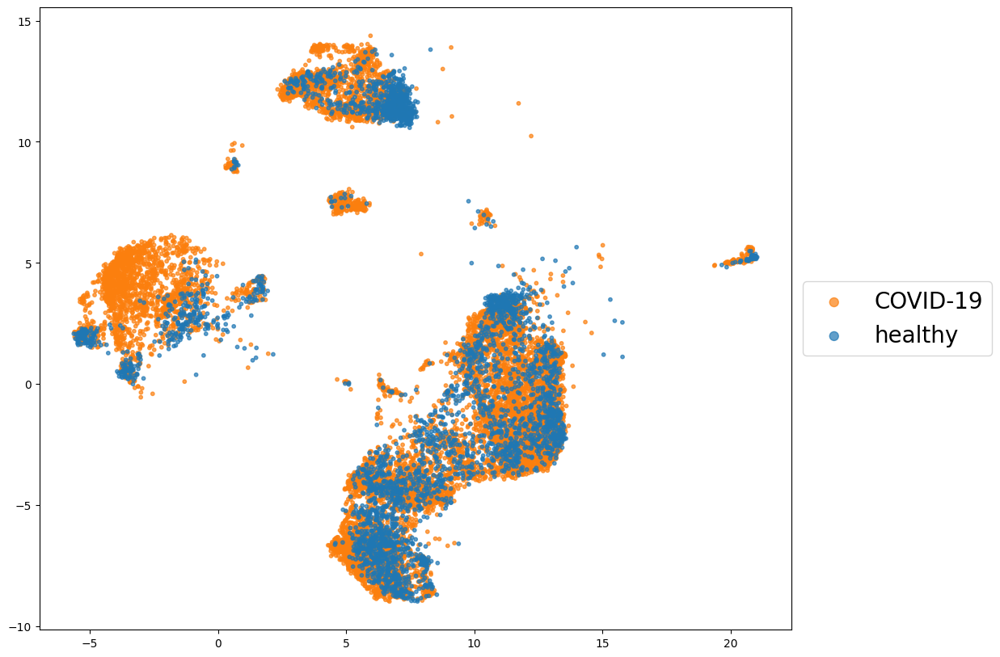

In [ ]:
import matplotlib.pyplot as plt

color_map = {
    'COVID-19': '#fb7f0e',#'#ccd6ab',
    'healthy': '#1f77b4',
}

plt.figure(figsize=(12, 10))
for disease_state in one_study.obs["disease"].unique():
    adata_sub = one_study[one_study.obs["disease"]==disease_state]
    plt.scatter(adata_sub.obsm["X_umap"][:, 0], adata_sub.obsm["X_umap"][:, 1], c = [color_map[disease_state]]*adata_sub.shape[0], s = 10, label = disease_state, alpha = 0.7)

plt.legend(
    fontsize=20,
    loc='center left',
    bbox_to_anchor=(1, 0.5),
    scatterpoints=1,
    markerscale=2.5   # increase this value to make legend markers bigger
)
plt.savefig(f"./figures/interpretability_umap_disease.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()

### Cells colored by study

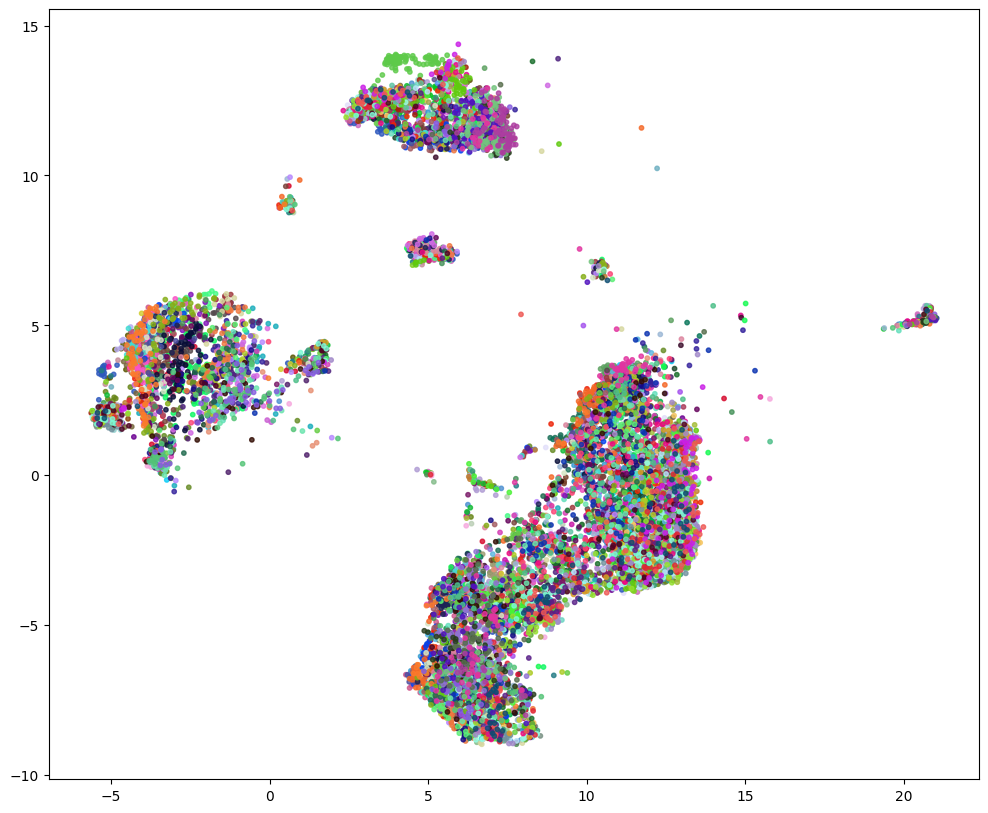

In [23]:
import random

def assign_random_colors_to_classes(classes):
    """
    Given an iterable of class labels (strings, ints, etc.),
    return a dict mapping each unique class to a random RGB color.
    """
    unique_classes = list(set(classes))  # Get unique class labels
    color_map = {}
    for cls in unique_classes:
        color_map[cls] = (random.random(), random.random(), random.random())
    return color_map

color_map = assign_random_colors_to_classes(one_study.obs["study::::sample"].unique())

plt.figure(figsize=(12, 10))
for disease_state in one_study.obs["study::::sample"].unique():
    adata_sub = one_study[one_study.obs["study::::sample"]==disease_state]
    plt.scatter(adata_sub.obsm["X_umap"][:, 0], adata_sub.obsm["X_umap"][:, 1], c = [color_map[disease_state]]*adata_sub.shape[0], s = 10, label = disease_state, alpha = 0.8)

plt.savefig(f"./figures/interpretability_umap_sample.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()

### Cells colored by cell type

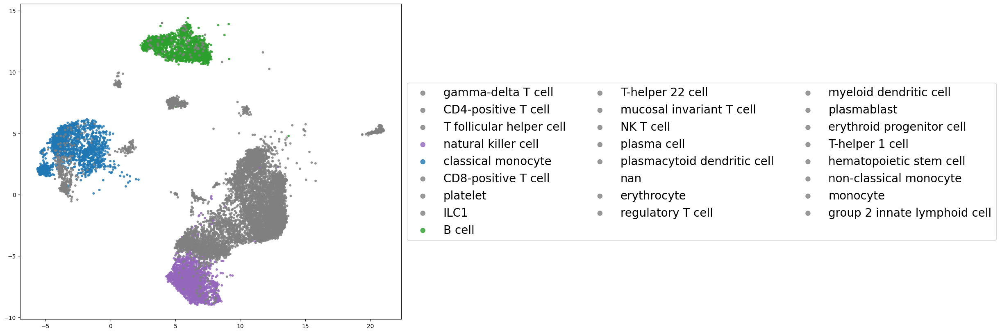

In [24]:
color_map = {v: "grey" for v in one_study.obs["cell_type_mapped"].unique()}
color_map["classical monocyte"] = "#1f77b4"
color_map["non-classical monocyte"] = "grey"
color_map["monocyte"] = "grey"
color_map["B cell"] = "#2ca02c"
color_map["natural killer cell"] = "#9467bd"

plt.figure(figsize=(12, 10))
for disease_state in one_study.obs["cell_type_mapped"].unique():
    adata_sub = one_study[one_study.obs["cell_type_mapped"]==disease_state]
    plt.scatter(adata_sub.obsm["X_umap"][:, 0], adata_sub.obsm["X_umap"][:, 1], c = [color_map[disease_state]]*adata_sub.shape[0], s = 10, label = disease_state, alpha = 0.8)
    #plt.legend(adata.obs["disease"].unique(),fontsize = 20, loc = 'center left', bbox_to_anchor=(1, 0.5))

plt.legend(
    fontsize=20,
    loc='center left',
    bbox_to_anchor=(1, 0.5),
    scatterpoints=1,
    markerscale=2.5,   # increase this value to make legend markers bigger
    ncol=3,
)
plt.savefig(f"./figures/interpretability_umap_ct.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()

### Cells colored by attribution

/tmp/ipykernel_3015112/533914386.py:16: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



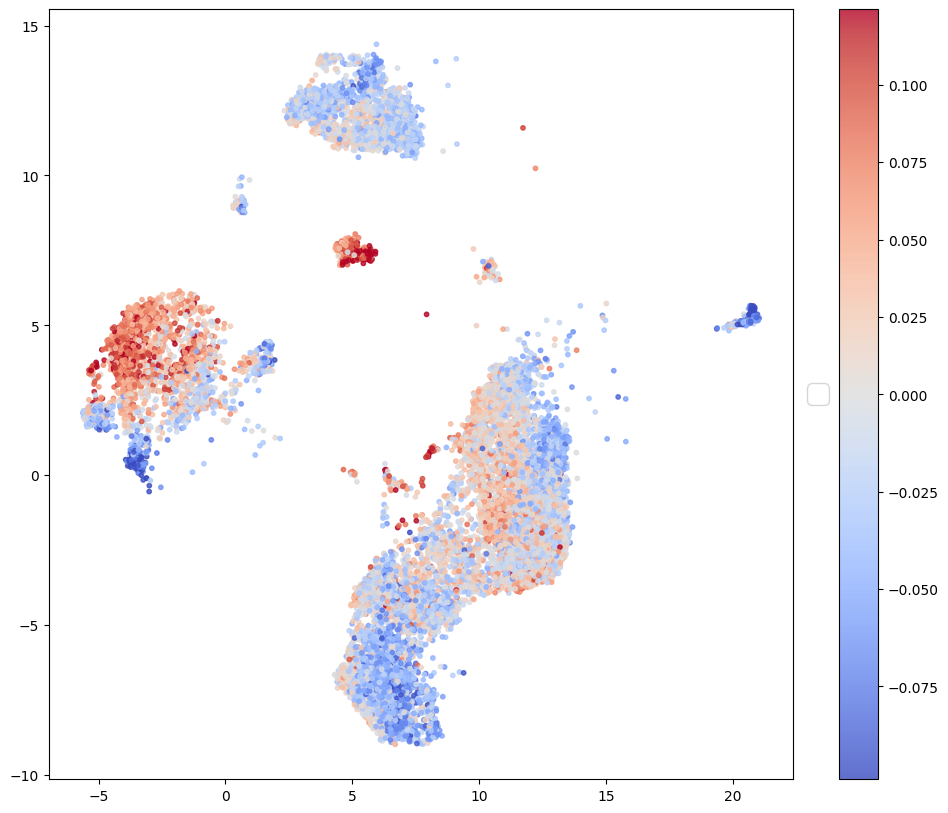

In [25]:
import matplotlib.colors as mcolors

plt.figure(figsize=(12, 10))

vmax = np.percentile(one_study.obs["total_attribution"], 99)
vmin = np.percentile(one_study.obs["total_attribution"], 1)

total_range = vmax - vmin
positive_range = vmax - 0
center = (0 - vmin) / total_range

norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=0., vmax=vmax)

plt.scatter(one_study.obsm["X_umap"][:, 0], one_study.obsm["X_umap"][:, 1], c = one_study.obs["total_attribution"], cmap="coolwarm", norm = norm, s = 10, alpha = 0.8)

plt.legend(
    fontsize=20,
    loc='center left',
    bbox_to_anchor=(1, 0.5),
    scatterpoints=1,
    markerscale=2.5,   # increase this value to make legend markers bigger
    ncol=3,
)

plt.colorbar()
plt.savefig(f"./figures/interpretability_umap_attrs.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()

## Figure 4 - panel E

### Each dot is a cell

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

classical monocyte_COVID-19 vs. classical monocyte_healthy: t-test independent samples, P_val:1.435e-123 t=2.571e+01
natural killer cell_COVID-19 vs. natural killer cell_healthy: t-test independent samples, P_val:2.868e-49 t=1.511e+01
B cell_COVID-19 vs. B cell_healthy: t-test independent samples, P_val:1.271e-35 t=1.272e+01


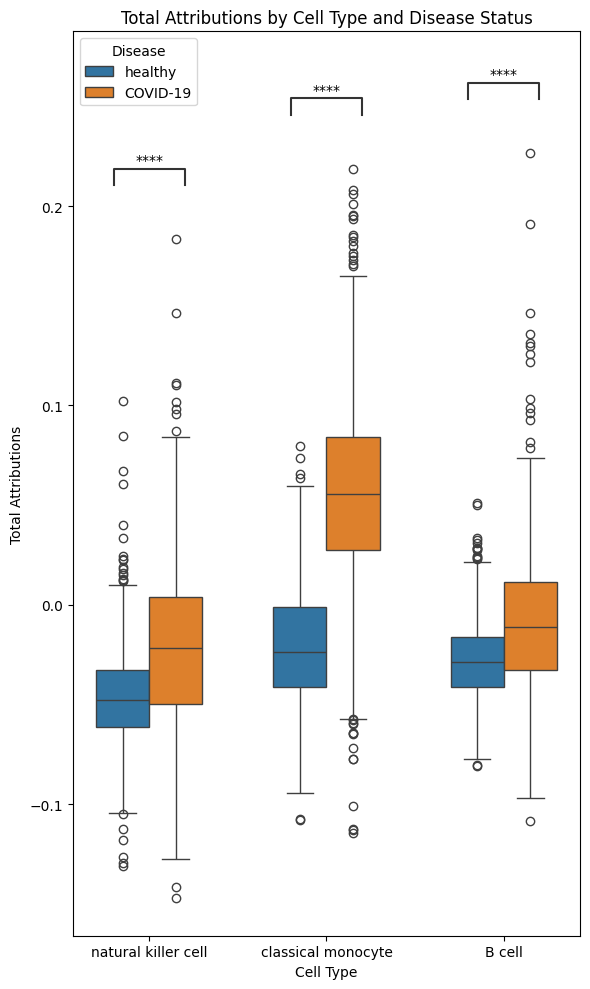

In [26]:
import seaborn as sns
from statannotations.Annotator import Annotator
from scipy.stats import ttest_ind  # or mannwhitneyu, etc.

color_map = {
    'COVID-19': '#fb7f0e',#'#ccd6ab',
    'healthy': '#1f77b4',
}

df = one_study.obs[one_study.obs['cell_type_mapped'].isin(['classical monocyte','B cell', 'natural killer cell'])]
df = df[["cell_type_mapped","total_attribution","disease"]].copy()
df['cell_type_mapped'] = df['cell_type_mapped'].astype(str)

plt.figure(figsize=(6, 10))
ax = sns.boxplot(
    data=df,
    x='cell_type_mapped',
    y='total_attribution',
    hue='disease',
    palette=color_map,  # or try 'pastel', 'muted', etc.
    width= 0.6,
    dodge = True,
    hue_order = ['healthy', 'COVID-19']
)

cell_types = df['cell_type_mapped'].unique()
pairs = [((ct, 'healthy'), (ct, 'COVID-19')) for ct in cell_types]

annotator = Annotator(ax, pairs, data=df, x='cell_type_mapped', y='total_attribution', hue='disease')
annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=1)
annotator.apply_and_annotate()

plt.xlabel('Cell Type')
plt.ylabel('Total Attributions')
plt.title('Total Attributions by Cell Type and Disease Status')
plt.legend(title='Disease')
plt.tight_layout()
plt.savefig(f"./figures/interpretability_umap_attrs_boxplot.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()


### Each dot is a sample

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

natural killer cell_healthy vs. natural killer cell_COVID-19: t-test independent samples, P_val:1.168e-05 t=-4.553e+00
B cell_healthy vs. B cell_COVID-19: t-test independent samples, P_val:5.286e-07 t=-5.279e+00
classical monocyte_healthy vs. classical monocyte_COVID-19: t-test independent samples, P_val:2.574e-09 t=-6.454e+00


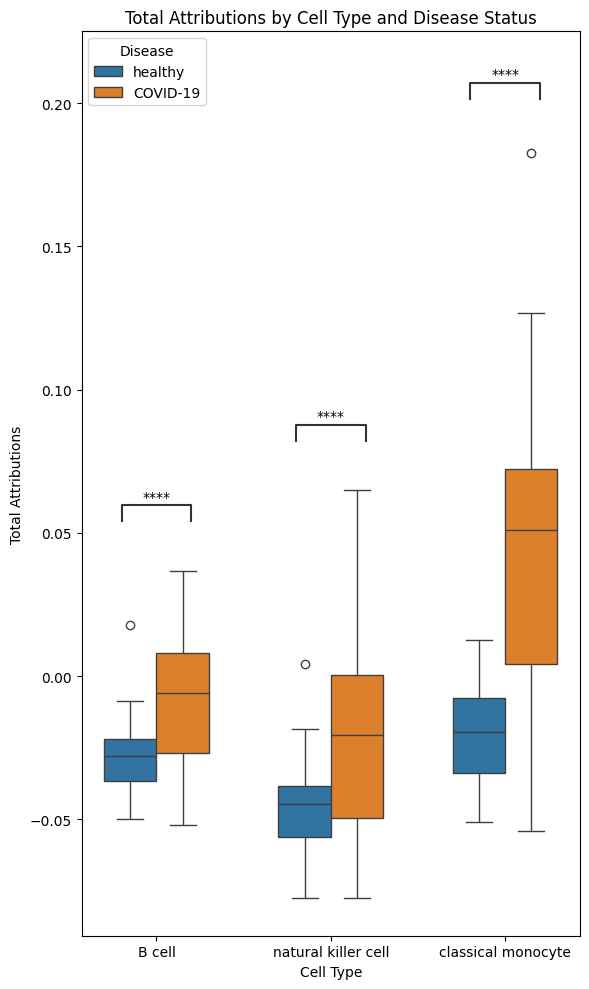

In [27]:
import seaborn as sns
from statannotations.Annotator import Annotator
from scipy.stats import ttest_ind  # or mannwhitneyu, etc.

color_map = {
    'COVID-19': '#fb7f0e',#'#ccd6ab',
    'healthy': '#1f77b4',
}

df = one_study.obs[one_study.obs['cell_type_mapped'].isin(['classical monocyte','B cell', 'natural killer cell'])]
df = df[["cell_type_mapped","total_attribution","disease","study::::sample"]].copy()
df['cell_type_mapped'] = df['cell_type_mapped'].astype(str)

sample_to_disease_dict = df.groupby("study::::sample")["disease"].first().to_dict()
df_ = df.groupby(['study::::sample','cell_type_mapped'])["total_attribution"].mean().reset_index()
df_["disease"] = df_["study::::sample"].map(sample_to_disease_dict)
# Assuming you already have a DataFrame named df

plt.figure(figsize=(6, 10))
ax = sns.boxplot(
    data=df_,
    x='cell_type_mapped',
    y='total_attribution',
    hue='disease',
    palette=color_map,  # or try 'pastel', 'muted', etc.
    width= 0.6,
    dodge = True,
    hue_order = ['healthy', 'COVID-19']
)

cell_types = df_['cell_type_mapped'].unique()
pairs = [((ct, 'healthy'), (ct, 'COVID-19')) for ct in cell_types]

annotator = Annotator(ax, pairs, data=df_, x='cell_type_mapped', y='total_attribution', hue='disease')
annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=1)
annotator.apply_and_annotate()

plt.xlabel('Cell Type')
plt.ylabel('Total Attributions')
plt.title('Total Attributions by Cell Type and Disease Status')
plt.legend(title='Disease')
plt.tight_layout()
plt.savefig(f"./figures/interpretability_umap_attrs_per_sample_boxplot.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()

## Tissue-specific analysis (Appendix I)

In [ ]:
import anndata
import pandas as pd
from pascient.data.data_scimilarity import import_cell_ontology, get_id_mapper
import numpy as np

adata_full = anndata.read_h5ad("/homefs/home/debroue1/projects/cellm/data/pascient/attributions/new_multilabel_diff_attributions_multilabel_covid.h5ad")

onto = import_cell_ontology()
id2name = get_id_mapper(onto)
adata_full.obs["cell_type"] = adata_full.obs["cell_type"].map(id2name)

aggregation_type = "relu" # or relu #this selects the type of aggregation.

/homefs/home/debroue1/miniforge3/envs/cellm/lib/python3.11/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [13]:
from scipy.sparse import diags

adata_full.obsm["X_relu"] = adata_full.X.multiply(adata_full.X > 0)

norm_factor = adata_full.obsm["X_relu"].sum(axis=1).A1  # Flatten to 1D
normalizer = diags(1 / norm_factor)  # Construct a diagonal matrix
adata_full.obsm["X_relu_norm"] =  normalizer.dot(adata_full.obsm["X_relu"])

adata_blood = adata_full[(adata_full.obs["disease"] == "COVID-19") & (adata_full.obs["tissue"]=="blood")]
adata_lung = adata_full[(adata_full.obs["disease"] == "COVID-19") & (adata_full.obs["tissue"]=="lung")]


In [14]:
blood_act = adata_blood.obsm["X_relu_norm"].sum(axis=0)
lung_act = adata_lung.obsm["X_relu_norm"].sum(axis=0)

import plotly.express as px
import pandas as pd
import numpy as np

# Assuming point_names, blood_act, and lung_act are already defined
gene_names = adata_full.var.index.to_list()
x_vals = np.array(blood_act)[0]
y_vals = np.array(lung_act)[0]

x_vals = x_vals / np.max(x_vals)
y_vals = y_vals / np.max(y_vals)

# Create a DataFrame for easy plotting
df = pd.DataFrame({
    "Blood": x_vals,
    "Lung": y_vals,
    "Gene": gene_names
})

fig = px.scatter(df, x="Blood", y="Lung", hover_name="Gene")
fig.update_layout(
    title="Blood vs Lung Activity",
    xaxis_title="Blood",
    yaxis_title="Lung",
)
fig.write_html("./figures/blood_vs_lung_plot.html")
fig.show()

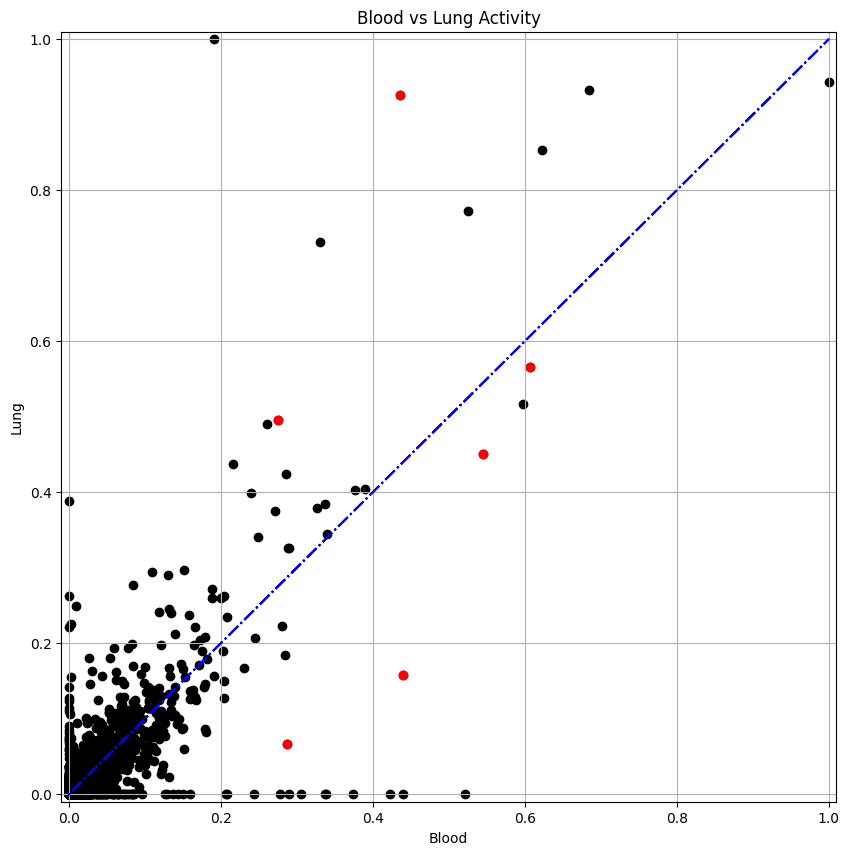

In [15]:
import matplotlib.pyplot as plt

highlight_genes = ["S100A10", "IFITM3", "S100A8","SELL","LIMD2", "KLF2"]

plt.figure(figsize=(10, 10))
plt.scatter(x_vals, y_vals, color = "black")
for gene in highlight_genes:
    plt.scatter(x_vals[gene_names.index(gene)], y_vals[gene_names.index(gene)], color = "red", label=gene)

# Add regression line
z = np.polyfit(x_vals, y_vals, 1)
p = np.poly1d([1,0])
plt.plot(x_vals, p(x_vals), color='blue', linestyle='-.', label='Regression line')
plt.xlabel("Blood")
plt.ylabel("Lung")
plt.title("Blood vs Lung Activity")
plt.xlim(-0.01, 1.01)
plt.ylim(-0.01, 1.01)
plt.grid()
plt.savefig("./figures/blood_vs_lung_plot.pdf", bbox_inches="tight")
plt.show()